In [1]:
# numeric libraries
import numpy as np
import pandas as pd

#python library
import random 
import os

#ploting library
import plotly
import plotly.express as px
import matplotlib.pyplot as plt

#image library
from PIL import Image
import cv2

## BASIC EDA

In [2]:
train_df = pd.read_csv("../input/petfinder-pawpularity-score/train.csv")
train_df.head()

,Id,Subject Focus,Eyes,Face,Near,Action,Accessory,Group,Collage,Human,Occlusion,Info,Blur,Pawpularity
0,0007de18844b0dbbb5e1f607da0606e0,0,1,1,1,0,0,1,0,0,0,0,0,63
1,0009c66b9439883ba2750fb825e1d7db,0,1,1,0,0,0,0,0,0,0,0,0,42
2,0013fd999caf9a3efe1352ca1b0d937e,0,1,1,1,0,0,0,0,1,1,0,0,28
3,0018df346ac9c1d8413cfcc888ca8246,0,1,1,1,0,0,0,0,0,0,0,0,15
4,001dc955e10590d3ca4673f034feeef2,0,0,0,1,0,0,1,0,0,0,0,0,72


## Checking if the metadata have strong correlation to pawpularity score
Seems like all of them do not have strong correlation to pawpularity
1. Blur
2. Group
3. Accessory 
4. Subject focus


In [3]:
train_df.corr().abs().sort_values(by="Pawpularity", ascending=False)

,Subject Focus,Eyes,Face,Near,Action,Accessory,Group,Collage,Human,Occlusion,Info,Blur,Pawpularity
Pawpularity,0.009853,0.006686,0.008018,0.001001,0.001373,0.013287,0.016469,0.001732,0.003983,0.001979,0.004735,0.023540,1.000000
Blur,0.046407,0.507323,0.068198,0.017566,0.012009,0.035012,0.007899,0.026591,0.015941,0.006338,0.022604,1.000000,0.023540
Group,0.052150,0.084975,0.108022,0.319107,0.002432,0.057301,1.000000,0.132007,0.104287,0.003568,0.063311,0.007899,0.016469
Accessory,0.020619,0.052480,0.034788,0.030234,0.025377,1.000000,0.057301,0.065860,0.041745,0.038912,0.075063,0.035012,0.013287
Subject Focus,1.000000,0.076794,0.038252,0.058672,0.014006,0.020619,0.052150,0.038534,0.075295,0.076851,0.040498,0.046407,0.009853
Face,0.038252,0.584484,1.000000,0.139031,0.012022,0.034788,0.108022,0.050847,0.024170,0.013389,0.024704,0.068198,0.008018
Eyes,0.076794,1.000000,0.584484,0.133127,0.020544,0.052480,0.084975,0.066361,0.036046,0.022143,0.038179,0.507323,0.006686
Info,0.040498,0.038179,0.024704,0.146188,0.017191,0.075063,0.063311,0.482141,0.018171,0.117725,1.000000,0.022604,0.004735
Human,0.075295,0.036046,0.024170,0.065215,0.009429,0.041745,0.104287,0.011476,1.000000,0.634381,0.018171,0.015941,0.003983
Occlusion,0.076851,0.022143,0.013389,0.009287,0.010832,0.038912,0.003568,0.054611,0.634381,1.000000,0.117725,0.006338,0.001979


## Checking the distribution of Pawpularity
There is disproportion number of pictures with 100 score. Seems like something is going on there. The mode is 30 

<AxesSubplot:>

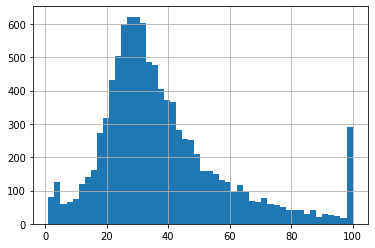

In [4]:
train_df['Pawpularity'].hist(bins=50)

## Lets take a look at those with 100 score and those with low score
Conclusion is that there are no obvious difference between the high score and low score photo

## Pictures with 100 score

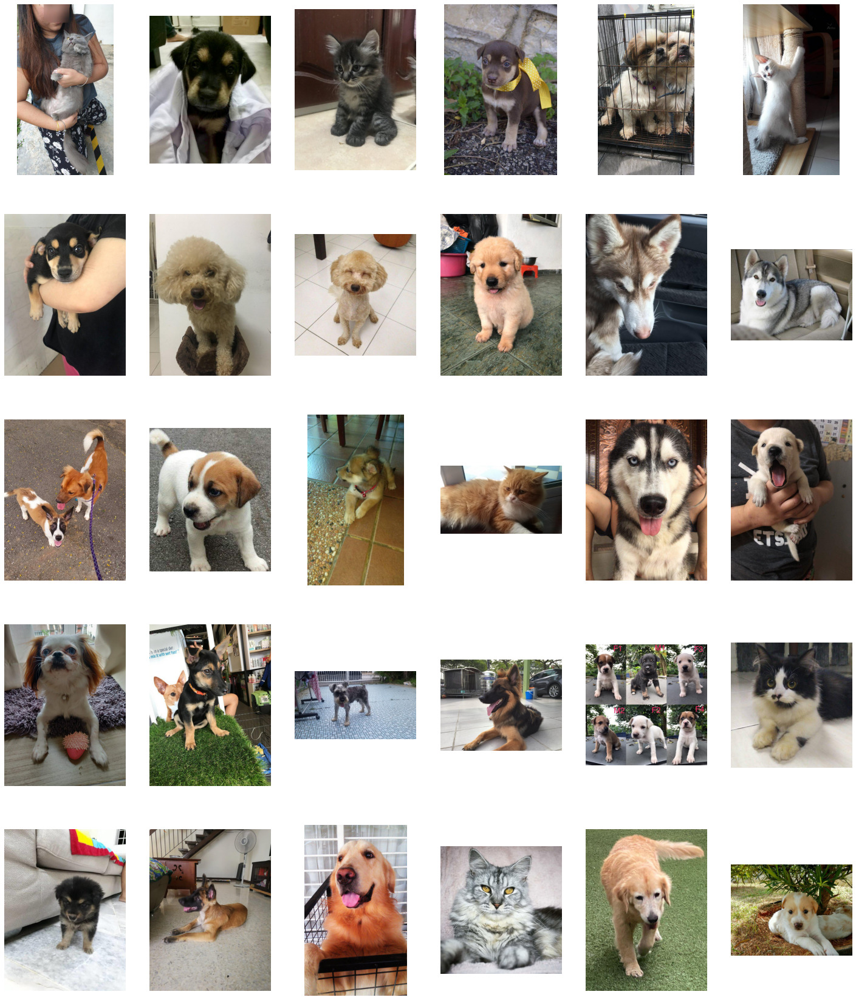

In [5]:
fig = plt.figure(figsize=(25,30))
sub_df = train_df[train_df["Pawpularity"]==100].sample(30)

for i in range(30):
    image_id = sub_df.iloc[i]['Id']
    image_fp = os.path.join("../input/petfinder-pawpularity-score/train", image_id+".jpg")
    img = Image.open(image_fp)
    subplot =  fig.add_subplot(5,6,i+1)
    subplot.imshow(img)
    subplot.axis("off")
    
plt.show()

## Pictures with low score

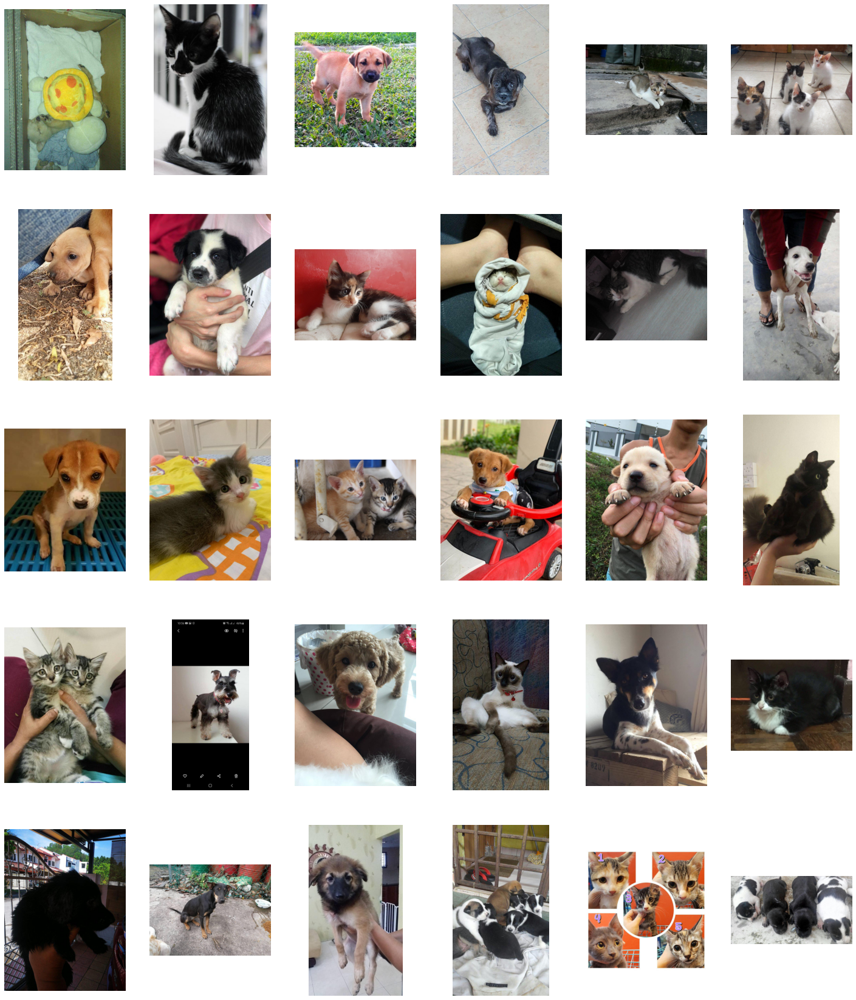

In [6]:
fig = plt.figure(figsize=(25,30))
sub_df = train_df[train_df["Pawpularity"]<5].sample(30)

for i in range(30):
    image_id = sub_df.iloc[i]['Id']
    image_fp = os.path.join("../input/petfinder-pawpularity-score/train", image_id+".jpg")
    img = Image.open(image_fp)
    subplot =  fig.add_subplot(5,6,i+1)
    subplot.imshow(img)
    subplot.axis("off")
    
plt.show()

## What are blur images

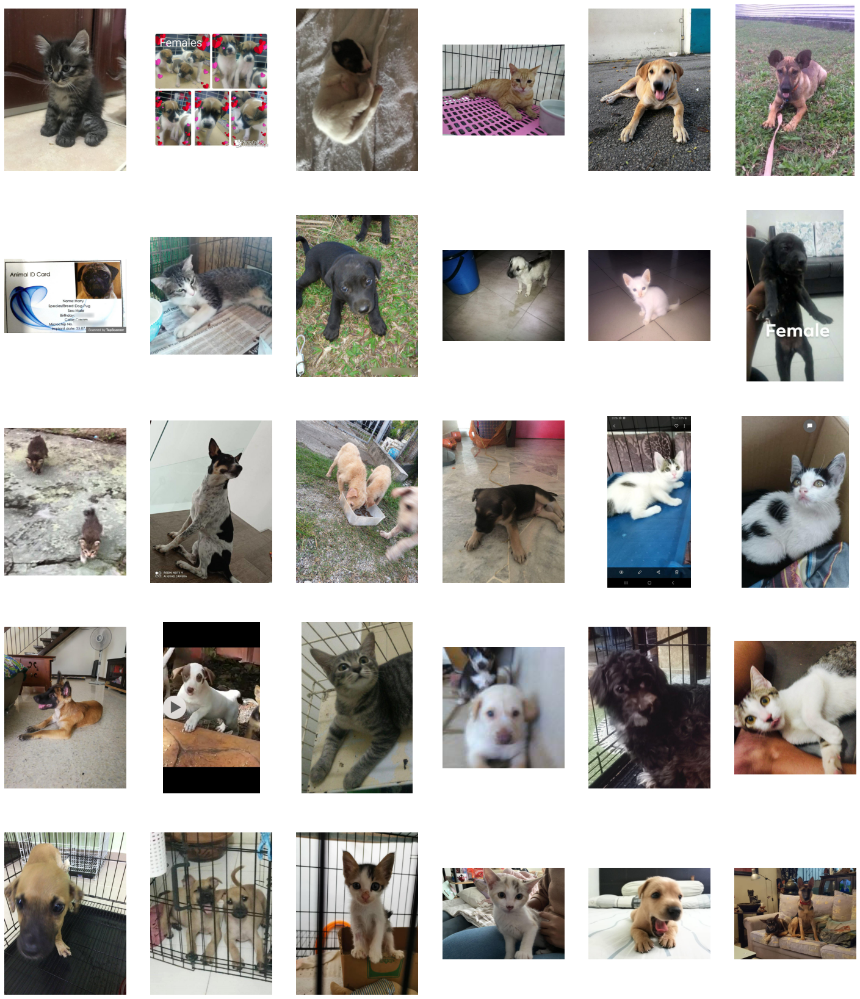

In [7]:
fig = plt.figure(figsize=(25,30))
sub_df = train_df[train_df["Blur"]==1].sample(30)

for i in range(30):
    image_id = sub_df.iloc[i]['Id']
    image_fp = os.path.join("../input/petfinder-pawpularity-score/train", image_id+".jpg")
    img = Image.open(image_fp)
    subplot =  fig.add_subplot(5,6,i+1)
    subplot.imshow(img)
    subplot.axis("off")
    
plt.show()